#Initials

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import sys
import time
import random
import warnings
import itertools
import numpy as np
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import PIL
from PIL import Image

from sklearn import metrics
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.init as init
import torch.nn.functional as F
from torch.utils.data import Dataset, random_split, DataLoader

import torchvision.models as models
import torchvision.transforms as transforms

from torchvision.models import resnet50

#GPU

In [ ]:
def get_default_device():
  if torch.cuda.is_available(): return torch.device("cuda")
  else: return torch.device("cpu")

def to_device(data, device):
  if isinstance(data, (list, tuple)): return [to_device(x, device) for x in data]
  return data.to(device, non_blocking = True)

class DeviceDataLoader():
  def __init__(self, dataloader, device):
    self.dataloader, self.device = dataloader, device
  def __iter__(self):
    for batch in self.dataloader: yield to_device(batch, self.device)
  def __len__(self):
    return len(self.dataloader)

In [ ]:
device = get_default_device()
print(f"Running code on :", device)

Running code on : cpu


#Utils

In [ ]:
#do not plot warnings
def warn(*args, **kwargs):
    pass
warnings.warn = warn

In [ ]:
class DataAugmentation():
    def __init__(self,):
        self.horizontal = random.random()
        self.vertical = random.random()
        self.rotate = random.choice([0, 1, -1])

        self.contrast = random.uniform(0.5, 1.5)
        self.brightness = random.uniform(0.5, 1.5)

        self.red = random.uniform(0.5, 1.5)
        self.green = random.uniform(0.5, 1.5)
        self.blue = random.uniform(0.5, 1.5)

    def __call__(self, img):

        # if self.horizontal >= 0.5:
        #     img = transforms.functional.hflip(img)
        # if self.vertical >= 0.5:
        #     img = transforms.functional.vflip(img)

        # if self.rotate !=0:
        #   img = torch.rot90(img, k=self.rotate, dims=(1, 2))

        # img = (img - torch.mean(img)) * self.contrast + torch.mean(img)
        # img *= self.brightness

        # img[0] *= self.red
        # img[1] *= self.green
        # img[2] *= self.blue

        return img

In [ ]:
def unnorm(img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(s)

    return img

In [ ]:
class sample_fake(object):
    def __init__(self, max_imgs=50):
        self.max_imgs = max_imgs
        self.cur_img = 0
        self.imgs = list()

    def __call__(self, imgs):
        ret = list()
        for img in imgs:
            if self.cur_img < self.max_imgs:
                self.imgs.append(img)
                ret.append(img)
                self.cur_img += 1
            else:
                if np.random.ranf() > 0.5:
                    idx = np.random.randint(0, self.max_imgs)
                    ret.append(self.imgs[idx])
                    self.imgs[idx] = img
                else:
                    ret.append(img)
        return ret

In [ ]:
class lr_sched():
    def __init__(self, decay_epochs=100, total_epochs=200):
        self.decay_epochs = decay_epochs
        self.total_epochs = total_epochs

    def step(self, epoch_num):
        if epoch_num <= self.decay_epochs:
            return 1.0
        else:
            fract = (epoch_num - self.decay_epochs)  / (self.total_epochs - self.decay_epochs)
            return 1.0 - fract

In [ ]:
class AvgStats(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.losses =[]
        self.its = []

    def append(self, loss, it):
        self.losses.append(loss)
        self.its.append(it)

In [ ]:
def update_req_grad(models, requires_grad=True):
    for model in models:
        for param in model.parameters():
            param.requires_grad = requires_grad

In [ ]:
def load_checkpoint(ckpt_path, map_location=None):
    ckpt = torch.load(ckpt_path, map_location=map_location)
    print(' [*] Loading checkpoint from %s succeed!' % ckpt_path)
    return ckpt

In [ ]:
def load_checkpoint(ckpt_path, gan, map_location):

    checkpoint = torch.load(ckpt_path, map_location=map_location)
    gan.generator.load_state_dict(checkpoint['generator'])
    gan.discriminator.load_state_dict(checkpoint['discriminator'])
    gan.adam_gen.load_state_dict(checkpoint['gen_optimizer'])
    gan.adam_disc.load_state_dict(checkpoint['disc_optimizer'])

In [ ]:
def save_checkpoint(gan, save_path):

    save_dict = {'generator': gan.generator.state_dict(),
               'discriminator': gan.discriminator.state_dict(),
               'gen_optimizer': gan.adam_gen.state_dict(),
               'disc_optimizer': gan.adam_disc.state_dict()}

    torch.save(save_dict, save_path)

#Dataloader

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, night_dir, mode):
        self.root_dir = root_dir
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith('.jpg') or fname.endswith('.png')]
        self.night_paths = sorted([os.path.join(night_dir, fname) for fname in os.listdir(night_dir) if fname.endswith('.jpg') or fname.endswith('.png')])

        self.train_image_paths, self.test_image_paths = self.image_paths[:700], self.image_paths[700:]
        self.train_night_paths, self.test_night_paths = self.night_paths[:700], self.night_paths[700:]

        self.image_train_len = len(self.train_image_paths)
        self.image_test_len = len(self.test_image_paths)

        self.night_train_len = len(self.train_night_paths)
        self.night_test_len = len(self.test_night_paths)

        self.mode = mode

    def read_image(self, path):
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def make_adverse(self, image):
        image_rain = self.rain(image, 5)#random.choice([0,1,2,3,4,5]))
        image_snow = self.snow(image, 5)#random.choice([0,1,2,3,4,5]))
        image_haze = self.haze(image, 5)#random.choice([0,1,2,3,4,5]))
        return image_rain, image_snow, image_haze

    def process_image(self, image):
        image = np.asarray(image, dtype=np.uint8)
        image = Image.fromarray(image.astype(np.uint8))
        image = self.transform(image)
        return image

    def rain(self, image, prob):
        rain = np.zeros(image.shape,np.uint8)
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                rdn = random.random()
                if rdn > (1-(prob)/1000):
                    for k in range(15):
                        rain[i-k][j] = 255
                else:
                    rain[i][j] = image[i][j]
        return rain

    def snow(self, image, num_points):
        snow = image.copy()
        height, width, _ = image.shape
        for _ in range(num_points*400+1):
            i = random.randint(0, width - 1)
            j = random.randint(0, height - 1)
            k, l = 10, 10
            thickness = random.choice([1,2])
            snow = cv2.circle(snow, (i - k, j - l), 2, (255,255,255), thickness)
        return snow

    def haze(self, image, alpha):
        white_image = np.ones_like(image) * 255
        haze = cv2.addWeighted(image, 1 - (alpha)/10, white_image, (alpha)/10, 0)
        return haze

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):

        self.transform = transforms.Compose([transforms.Resize((512, 512)),
                                             transforms.ToTensor(),
                                             DataAugmentation(),
                                             transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

        if self.mode == 'train':
          self.day_path = self.train_image_paths
          self.night_path = self.night_paths
          self.len_day = self.image_train_len
          self.len_night = self.night_train_len
        else:
          self.day_path = self.test_image_paths
          self.night_path = self.night_paths
          self.len_day = self.image_test_len
          self.len_night = self.night_test_len

        img_path = self.day_path[random.randint(0, self.len_day - 1)]
        ind = random.randint(0, self.len_night - 1)
        night_path = self.night_path[ind]

        image = self.read_image(img_path)
        image_night = self.read_image(night_path)
        image_rain, image_snow, image_haze = self.make_adverse(image)

        image = self.process_image(image)
        image_rain = self.process_image(image_rain)
        image_snow = self.process_image(image_snow)
        image_haze = self.process_image(image_haze)
        image_night = self.process_image(image_night)

        return image, 0. , image_rain, 1., image_snow, 2., image_haze, 3., image_night, 4.

# Create separate datasets for training and testing
train_dataset = CustomDataset(root_dir='/content/drive/MyDrive/my_data/normal/day',
                              night_dir='/content/drive/MyDrive/my_data/normal/night',
                              #indexes = indexes,
                              mode='train')

test_dataset = CustomDataset(root_dir='/content/drive/MyDrive/my_data/normal/day',
                             night_dir='/content/drive/MyDrive/my_data/normal/night',
                             #indexes = indexes,
                             mode='test')

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

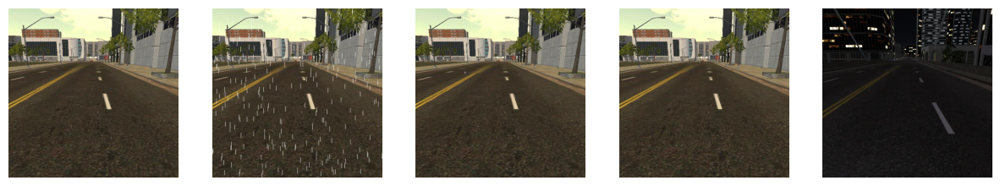

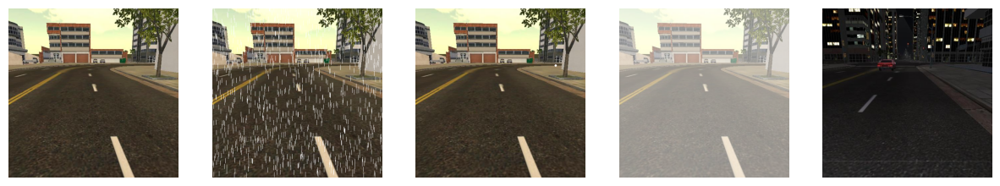

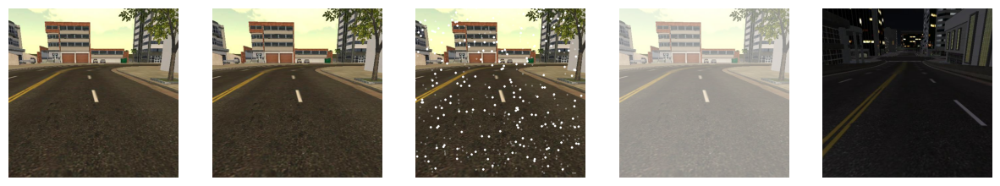

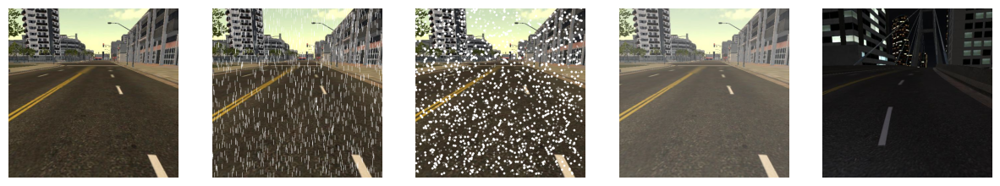

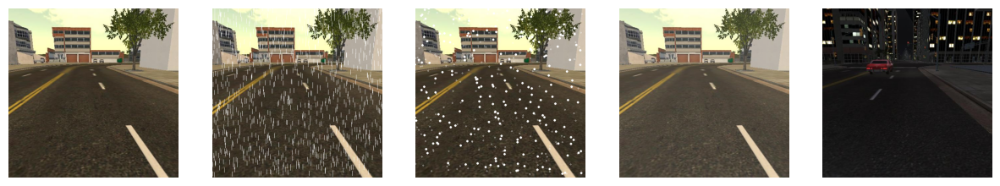

...

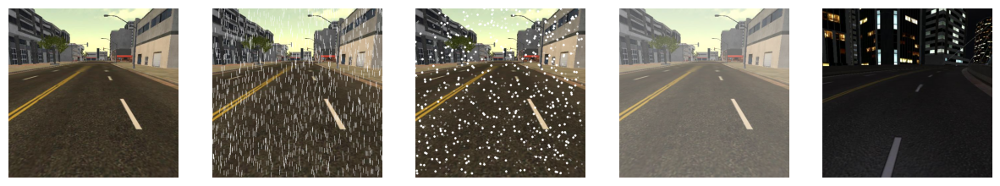

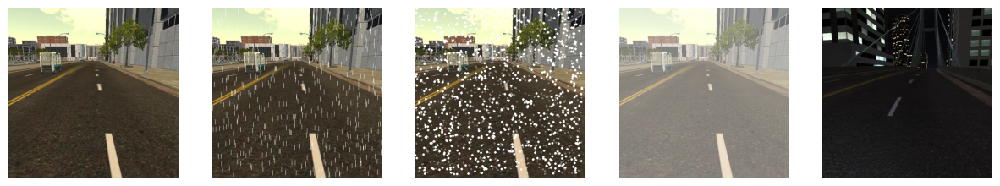

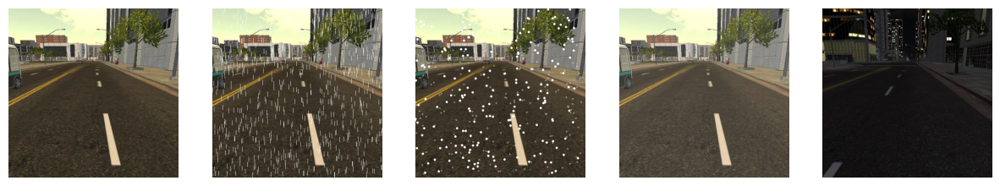

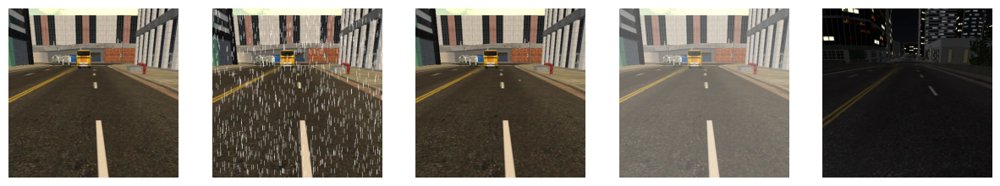

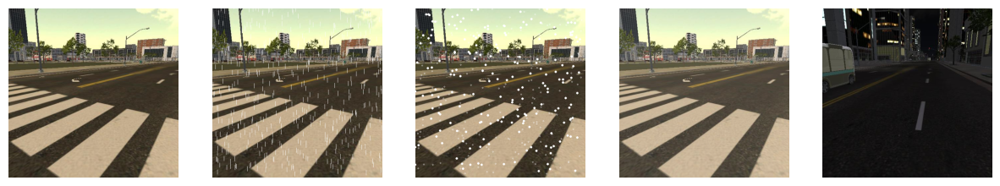

In [ ]:
def plot():

  old_stderr = sys.stderr
  sys.stderr = open(os.devnull, 'w')

  n = 5

  plt.figure(figsize=(15, 15))

  for i in range(n):
      day_images, label_day, rain_images, label_rain, snow_images, label_snow, haze_images, label_haze, night_images, label_night = next(iter(train_loader))

      plt.subplot(1, n, 1)
      plt.imshow(unnorm(day_images[0]).permute(1, 2, 0))
      plt.axis('off')

      plt.subplot(1, n, 2)
      plt.imshow(unnorm(rain_images[0]).permute(1, 2, 0))
      plt.axis('off')

      plt.subplot(1, n, 3)
      plt.imshow(unnorm(snow_images[0]).permute(1, 2, 0))
      plt.axis('off')

      plt.subplot(1, n, 4)
      plt.imshow(unnorm(haze_images[0]).permute(1, 2, 0))
      plt.axis('off')

      plt.subplot(1, n, 5)
      plt.imshow(unnorm(night_images[0]).permute(1, 2, 0))
      plt.axis('off')

  plt.show()

  sys.stderr = old_stderr

for i in range(50):
  plot()

#Model

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.conv1 = nn.Conv2d(4, 48, kernel_size=4, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(48)
        self.relu1 = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(48, 72, kernel_size=4, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(72)
        self.relu2 = nn.ReLU(inplace=True)

        self.conv3 = nn.Conv2d(72, 108, kernel_size=4, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(108)
        self.relu3 = nn.ReLU(inplace=True)

        self.capsule1 = CapsuleLayer(1, 108, 64, 64)
        self.capsule2 = CapsuleLayer(1, 1, 64, 64)
        self.capsule3 = CapsuleLayer(1, 1, 64, 64)

        self.deconv1 = nn.ConvTranspose2d(108, 72, kernel_size=4, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(72)
        self.relu4 = nn.ReLU(inplace=True)

        self.deconv2 = nn.ConvTranspose2d(72, 48, kernel_size=4, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(48)
        self.relu5 = nn.ReLU(inplace=True)

        self.deconv3 = nn.ConvTranspose2d(48, 3, kernel_size=4, stride=2, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, x, label):
        x = torch.cat([x, torch.full_like(x[:, :1, :, :], label, dtype=torch.float32)], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu3(x)

        x = self.capsule1(x)
        x = self.capsule2(x)
        x = self.capsule3(x)

        x = self.deconv1(x)
        x = self.bn4(x)
        x = self.relu4(x)

        x = self.deconv2(x)
        x = self.bn5(x)
        x = self.relu5(x)

        x = self.deconv3(x)
        x = self.tanh(x)

        return x

class CapsuleLayer(nn.Module):
    def __init__(self, in_capsules, out_capsules, in_capsule_dim, out_capsule_dim, num_iterations=1):
        super(CapsuleLayer, self).__init__()
        self.num_iterations = num_iterations
        self.weights = nn.Parameter(torch.randn(out_capsules, in_capsules, in_capsule_dim, out_capsule_dim))

    def forward(self, x):
        batch_size = x.size(0)
        u_hat = torch.matmul(self.weights, x)
        b = torch.zeros(batch_size, 1, x.size(3), 1).to(x.device)

        for _ in range(self.num_iterations):
            c = torch.softmax(b, dim=1)
            s = (c * u_hat).sum(dim=1, keepdim=True)
            v = self.squash(s)
            b = b + (u_hat * v).sum(dim=-1, keepdim=True)
        return v.permute(1,0,2,3)+x

    def squash(self, v):
        mag_sq = torch.sum(v**2, dim=-1, keepdim=True)
        mag = torch.sqrt(mag_sq)
        v = (mag_sq / (1.0 + mag_sq)) * (v / mag)
        return v

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, dropout_prob=0.5):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu1 = nn.LeakyReLU(0.2, inplace=True)
        self.dropout1 = nn.Dropout2d(dropout_prob)

        self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.relu2 = nn.LeakyReLU(0.2, inplace=True)
        self.dropout2 = nn.Dropout2d(dropout_prob)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.relu3 = nn.LeakyReLU(0.2, inplace=True)
        self.dropout3 = nn.Dropout2d(dropout_prob)

        self.conv4 = nn.Conv2d(256, 256, kernel_size=4, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.relu4 = nn.LeakyReLU(0.2, inplace=True)
        self.dropout4 = nn.Dropout2d(dropout_prob)

        self.conv5 = nn.Conv2d(256, 1, kernel_size=4, stride=2, padding=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.conv4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.conv5(x)
        x = self.sigmoid(x)

        return x

In [ ]:
def init_weights(net, init_type='normal', gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
            init.normal_(m.weight.data, 0.0, gain)
            if hasattr(m, 'bias') and m.bias is not None:
                init.constant_(m.bias.data, 0.0)
        elif classname.find('BatchNorm2d') != -1:
            init.normal_(m.weight.data, 1.0, gain)
            init.constant_(m.bias.data, 0.0)
    net.apply(init_func)

#GAN

In [ ]:
class CycleGAN(object):
    def __init__(self, in_ch, out_ch, epochs, device, start_lr=1e-4, cycle_coef=10, style_coef=0.1, decay_epoch=0):
        self.epochs = epochs
        self.decay_epoch = decay_epoch if decay_epoch > 0 else int(self.epochs/2)
        self.cycle = cycle_coef
        self.style = style_coef
        self.device = device
        self.real = torch.ones((32, 16, 16)).to(self.device)
        self.fake = torch.zeros((32, 16, 16)).to(self.device)
        self.generator = Generator()
        self.discriminator = Discriminator()
        self.init_models()
        self.mse_loss = nn.MSELoss()
        self.l1_loss = nn.L1Loss()
        self.adam_gen = torch.optim.Adam(itertools.chain(self.generator.parameters(), self.generator.parameters()), lr = start_lr, betas=(0.5, 0.999))
        self.adam_disc = torch.optim.Adam(itertools.chain(self.discriminator.parameters(), self.discriminator.parameters()), lr=start_lr, betas=(0.5, 0.999))
        self.sample_normal = sample_fake()
        self.sample_adverse = sample_fake()
        gen_lr = lr_sched(self.decay_epoch, self.epochs)
        disc_lr = lr_sched(self.decay_epoch, self.epochs)
        self.gen_lr_sched = torch.optim.lr_scheduler.LambdaLR(self.adam_gen, gen_lr.step)
        self.disc_lr_sched = torch.optim.lr_scheduler.LambdaLR(self.adam_disc, disc_lr.step)
        self.gen_stats = AvgStats()
        self.disc_stats = AvgStats()
        self.val_stats = AvgStats()
        self.style_stats = AvgStats()

        self.resnet = resnet50(pretrained=True)
        self.resnet = torch.nn.Sequential(*(list(self.resnet.children())[:-1])).eval().to(device)
        for param in self.resnet.parameters():
            param.requires_grad_(False)

        self.transform = transforms.Compose([transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

    def style_loss(self, img1, img2):
        img1 = self.transform(img1).to(device)
        img2 = self.transform(img2).to(device)
        features1 = self.resnet(img1)
        features2 = self.resnet(img2)
        loss = self.mse_loss(features1, features2)
        return loss

    def init_models(self):
        init_weights(self.generator)
        init_weights(self.discriminator)
        self.generator = self.generator.to(self.device)
        self.discriminator = self.discriminator.to(self.device)

    def train(self, train_loader, test_loader):

        for epoch in range(self.epochs):
            start_time = time.time()
            avg_gen_loss = 0.0
            avg_disc_loss = 0.0

            t = tqdm(train_loader, total=train_loader.__len__())

            for i, (day_img, label_day, rain_img, label_rain, snow_img, label_snow, haze_img, label_haze, night_img, label_night) in enumerate(t):
                rain_img, snow_img, haze_img, night_img, normal_img = rain_img.to(device), snow_img.to(device), haze_img.to(device), night_img.to(device), day_img.to(device)
                label_day, label_rain, label_snow, label_haze, label_night = label_day.to(device).item(), label_rain.to(device).item(), label_snow.to(device).item(), label_haze.to(device).item(), label_night.to(device).item()
                update_req_grad([self.discriminator, self.discriminator], False)
                self.adam_gen.zero_grad()

                # Forward pass through Generator
                normal_from_rain = self.generator(rain_img, label_rain)
                normal_from_snow = self.generator(snow_img, label_snow)
                normal_from_haze = self.generator(haze_img, label_haze)
                normal_from_night = self.generator(night_img, label_night)

                rain_from_normal = self.generator(normal_from_rain, label_rain)
                snow_from_normal = self.generator(normal_from_snow, label_snow)
                haze_from_normal = self.generator(normal_from_haze, label_haze)
                night_from_normal = self.generator(normal_from_night, label_night)

                normal_real = self.discriminator(normal_img)
                rain_real = self.discriminator(rain_img)
                snow_real = self.discriminator(snow_img)
                haze_real = self.discriminator(haze_img)
                night_real = self.discriminator(night_img)

                normal_from_rain_fake = self.discriminator(normal_from_rain)
                normal_from_snow_fake = self.discriminator(normal_from_snow)
                normal_from_haze_fake = self.discriminator(normal_from_haze)
                normal_from_night_fake = self.discriminator(normal_from_night)

                rain_from_normal_fake = self.discriminator(rain_from_normal)
                snow_from_normal_fake = self.discriminator(snow_from_normal)
                haze_from_normal_fake = self.discriminator(haze_from_normal)
                night_from_normal_fake = self.discriminator(night_from_normal)

                # Generator Loss
                cycle_loss = self.l1_loss(normal_from_rain, normal_img)\
                           + self.l1_loss(normal_from_snow, normal_img)\
                           + self.l1_loss(normal_from_haze, normal_img)\
                           + self.l1_loss(rain_from_normal, rain_img)\
                           + self.l1_loss(snow_from_normal, snow_img)\
                           + self.l1_loss(haze_from_normal, haze_img)\
                           + self.l1_loss(night_from_normal, night_img)

                style_loss = self.style_loss(rain_img, normal_from_rain)\
                           + self.style_loss(snow_img, normal_from_snow)\
                           + self.style_loss(haze_img, normal_from_haze)\
                           + self.style_loss(night_img, normal_from_night)

                adversarial_loss = self.mse_loss(normal_real, self.real)\
                                 + self.mse_loss(rain_real, self.real)\
                                 + self.mse_loss(snow_real, self.real)\
                                 + self.mse_loss(haze_real, self.real)\
                                 + self.mse_loss(night_real, self.real)\
                                 + self.mse_loss(normal_from_rain_fake, self.fake)\
                                 + self.mse_loss(normal_from_snow_fake, self.fake)\
                                 + self.mse_loss(normal_from_haze_fake, self.fake)\
                                 + self.mse_loss(normal_from_night_fake, self.fake)\
                                 + self.mse_loss(rain_from_normal_fake, self.fake)\
                                 + self.mse_loss(snow_from_normal_fake, self.fake)\
                                 + self.mse_loss(haze_from_normal_fake, self.fake)\
                                 + self.mse_loss(night_from_normal_fake, self.fake)

                generator_loss = 0.1*(self.cycle*cycle_loss + self.style*style_loss + adversarial_loss)
                avg_gen_loss += generator_loss.item()

                # Generator Backward pass
                generator_loss.backward()
                self.adam_gen.step()

                # Forward pass through Discriminator
                update_req_grad([self.discriminator, self.discriminator], True)
                self.adam_disc.zero_grad()

                normal_from_rain = torch.tensor(self.sample_normal([normal_from_rain.cpu().data.numpy()])[0]).to(self.device)
                normal_from_snow = torch.tensor(self.sample_normal([normal_from_snow.cpu().data.numpy()])[0]).to(self.device)
                normal_from_haze = torch.tensor(self.sample_normal([normal_from_haze.cpu().data.numpy()])[0]).to(self.device)
                normal_from_night = torch.tensor(self.sample_normal([normal_from_night.cpu().data.numpy()])[0]).to(self.device)

                rain_from_normal = torch.tensor(self.sample_normal([rain_from_normal.cpu().data.numpy()])[0]).to(self.device)
                snow_from_normal = torch.tensor(self.sample_normal([snow_from_normal.cpu().data.numpy()])[0]).to(self.device)
                haze_from_normal = torch.tensor(self.sample_normal([haze_from_normal.cpu().data.numpy()])[0]).to(self.device)
                night_from_normal = torch.tensor(self.sample_normal([night_from_normal.cpu().data.numpy()])[0]).to(self.device)

                normal_real = self.discriminator(normal_img)
                rain_real = self.discriminator(rain_img)
                snow_real = self.discriminator(snow_img)
                haze_real = self.discriminator(haze_img)
                night_real = self.discriminator(night_img)

                normal_from_rain_fake = self.discriminator(normal_from_rain)
                normal_from_snow_fake = self.discriminator(normal_from_snow)
                normal_from_haze_fake = self.discriminator(normal_from_haze)
                normal_from_night_fake = self.discriminator(normal_from_night)

                rain_from_normal_fake = self.discriminator(rain_from_normal)
                snow_from_normal_fake = self.discriminator(snow_from_normal)
                haze_from_normal_fake = self.discriminator(haze_from_normal)
                night_from_normal_fake = self.discriminator(night_from_normal)

                # Discriminator Loss
                real_loss = self.mse_loss(normal_real, self.real)\
                          + self.mse_loss(rain_real, self.real)\
                          + self.mse_loss(snow_real, self.real)\
                          + self.mse_loss(haze_real, self.real)\
                          + self.mse_loss(night_real, self.real)

                fake_loss = self.mse_loss(normal_from_rain_fake, self.fake)\
                          + self.mse_loss(normal_from_snow_fake, self.fake)\
                          + self.mse_loss(normal_from_haze_fake, self.fake)\
                          + self.mse_loss(normal_from_night_fake, self.fake)\
                          + self.mse_loss(rain_from_normal_fake, self.fake)\
                          + self.mse_loss(snow_from_normal_fake, self.fake)\
                          + self.mse_loss(haze_from_normal_fake, self.fake)\
                          + self.mse_loss(night_from_normal_fake, self.fake)

                discriminator_loss = 25*((real_loss + fake_loss) / 2)
                avg_disc_loss += discriminator_loss.item()

                # Discriminator Backward Pass
                discriminator_loss.backward()
                self.adam_disc.step()

                t.set_postfix(generator=generator_loss.item(), discriminator=discriminator_loss.item())

            # Epoch Results
            loss_validation = self.Validation(test_loader)

            avg_gen_loss /= train_loader.__len__()
            avg_disc_loss /= train_loader.__len__()


            time_req = time.time() - start_time

            self.gen_stats.append(avg_gen_loss, time_req)
            self.disc_stats.append(avg_disc_loss, time_req)
            self.val_stats.append(loss_validation, time_req)
            self.style_stats.append(self.style*style_loss.item(), time_req)

            print("Epoch %d | Generator Loss:%f | Discriminator Loss:%f" % (epoch+1, avg_gen_loss, avg_disc_loss))
            print("Epoch %d | Validation: %f" % (epoch+1, loss_validation))

            self.gen_lr_sched.step()
            self.disc_lr_sched.step()

            save_checkpoint(gan, '/content/drive/MyDrive/final.ckpt')


    def Validation(self, test_loader):
      with torch.no_grad():
        day_img, label_day, rain_img, label_rain, snow_img, label_snow, haze_img, label_haze, night_img, label_night = next(iter((test_loader)))
        rain_img, snow_img, haze_img, night_img, normal_img = rain_img.to(device), snow_img.to(device), haze_img.to(device), night_img.to(device), day_img.to(device)
        label_day, label_rain, label_snow, label_haze, label_night = label_day.to(device).item(), label_rain.to(device).item(), label_snow.to(device).item(), label_haze.to(device).item(), label_night.to(device).item()

        normal_from_rain = self.generator(rain_img, label_rain)
        normal_from_snow = self.generator(snow_img, label_snow)
        normal_from_haze = self.generator(haze_img, label_haze)
        normal_from_night = self.generator(night_img, label_night)

        rain_from_normal = self.generator(normal_from_rain, label_rain)
        snow_from_normal = self.generator(normal_from_snow, label_snow)
        haze_from_normal = self.generator(normal_from_haze, label_haze)
        night_from_normal = self.generator(normal_from_night, label_night)

        normal_real = self.discriminator(normal_img)
        rain_real = self.discriminator(rain_img)
        snow_real = self.discriminator(snow_img)
        haze_real = self.discriminator(haze_img)
        night_real = self.discriminator(night_img)

        normal_from_rain_fake = self.discriminator(normal_from_rain)
        normal_from_snow_fake = self.discriminator(normal_from_snow)
        normal_from_haze_fake = self.discriminator(normal_from_haze)
        normal_from_night_fake = self.discriminator(normal_from_night)
        rain_from_normal_fake = self.discriminator(rain_from_normal)
        snow_from_normal_fake = self.discriminator(snow_from_normal)
        haze_from_normal_fake = self.discriminator(haze_from_normal)
        night_from_normal_fake = self.discriminator(night_from_normal)

        # Generator Loss
        cycle_loss = self.l1_loss(normal_from_rain, normal_img)\
                   + self.l1_loss(normal_from_snow, normal_img)\
                   + self.l1_loss(normal_from_haze, normal_img)\
                   + self.l1_loss(rain_from_normal, rain_img)\
                   + self.l1_loss(snow_from_normal, snow_img)\
                   + self.l1_loss(haze_from_normal, haze_img)\
                   + self.l1_loss(night_from_normal, night_img)

        style_loss = self.style_loss(rain_img, normal_from_rain)\
                   + self.style_loss(snow_img, normal_from_snow)\
                   + self.style_loss(haze_img, normal_from_haze)\
                   + self.style_loss(night_img, normal_from_night)

        adversarial_loss = self.mse_loss(normal_real, self.real)\
                         + self.mse_loss(rain_real, self.real)\
                         + self.mse_loss(snow_real, self.real)\
                         + self.mse_loss(haze_real, self.real)\
                         + self.mse_loss(night_real, self.real)\
                         + self.mse_loss(normal_from_rain_fake, self.fake)\
                         + self.mse_loss(normal_from_snow_fake, self.fake)\
                         + self.mse_loss(normal_from_haze_fake, self.fake)\
                         + self.mse_loss(normal_from_night_fake, self.fake)\
                         + self.mse_loss(rain_from_normal_fake, self.fake)\
                         + self.mse_loss(snow_from_normal_fake, self.fake)\
                         + self.mse_loss(haze_from_normal_fake, self.fake)\
                         + self.mse_loss(night_from_normal_fake, self.fake)

        loss = 0.1*(self.cycle*cycle_loss + self.style*style_loss + adversarial_loss)

        f = plt.figure(figsize=(8,8))
        plt.subplot(121)
        plt.imshow(unnorm(rain_img[0]).permute(1, 2, 0).cpu().detach())
        plt.title('rain')
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(unnorm(normal_from_rain[0]).permute(1, 2, 0).cpu().detach())
        plt.title('normal')
        plt.axis('off')
        plt.show()

        f= plt.figure(figsize=(8,8))
        plt.subplot(121)
        plt.imshow(unnorm(snow_img[0]).permute(1, 2, 0).cpu().detach())
        plt.title('snow')
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(unnorm(normal_from_snow[0]).permute(1, 2, 0).cpu().detach())
        plt.title('normal')
        plt.axis('off')
        plt.show()

        f= plt.figure(figsize=(8,8))
        plt.subplot(121)
        plt.imshow(unnorm(haze_img[0]).permute(1, 2, 0).cpu().detach())
        plt.title('haze')
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(unnorm(normal_from_haze[0]).permute(1, 2, 0).cpu().detach())
        plt.title('normal')
        plt.axis('off')
        plt.show()

        f= plt.figure(figsize=(8,8))
        plt.subplot(121)
        plt.imshow(unnorm(night_img[0]).permute(1, 2, 0).cpu().detach())
        plt.title('night')
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(unnorm(normal_from_night[0]).permute(1, 2, 0).cpu().detach())
        plt.title('normal')
        plt.axis('off')
        plt.show()

        return loss.item()

#Train

In [ ]:
epoch = 10
gan = CycleGAN(3, 3, epoch, device)

# load_checkpoint('/content/drive/MyDrive/final.ckpt', gan, device)

total_params = sum(p.numel() for p in gan.generator.parameters())
print(f"No. of Generator Parameters: {total_params}")

total_params = sum(p.numel() for p in gan.discriminator.parameters())
print(f"No. of Discriminator Parameters: {total_params}")

gan.train(train_loader, test_loader)

#Test

In [ ]:
plt.xlabel("Epochs")
plt.ylabel("Losses")
plt.plot(gan.gen_stats.losses, 'r', label='Generator Loss')
plt.plot(gan.disc_stats.losses, 'b', label='Discriminator Loss')
plt.legend()
plt.show()

#Compare Results

In [ ]:
import numpy as np
from skimage.metrics import structural_similarity

def psnr(original, generated):
    original = original.squeeze().permute(1, 2, 0).cpu().numpy()
    generated = generated.squeeze().permute(1, 2, 0).cpu().numpy()
    mse = np.mean((original - generated) ** 2)
    max_pixel = 255.0
    return 10 * np.log10(max_pixel / np.sqrt(mse))

def ssim(original, generated):
    original = original.squeeze().permute(1, 2, 0).cpu().numpy()
    generated = generated.squeeze().permute(1, 2, 0).cpu().numpy()
    return structural_similarity(original, generated, multichannel=True)

In [ ]:
gan = CycleGAN(3, 3, 0, device)
load_checkpoint('/content/drive/MyDrive/dataset.ckpt', gan, device)

psnr_rain = []
psnr_snow = []
psnr_haze = []
psnr_night = []

ssim_rain = []
ssim_snow = []
ssim_haze = []
ssim_night = []

from torchmetrics.functional import peak_signal_noise_ratio as psnr
from torchmetrics.functional import structural_similarity_index_measure as ssim

for i in range(50):
  day_img, label_day, rain_img, label_rain, snow_img, label_snow, haze_img, label_haze, night_img, label_night = next(iter(test_loader))

  pred_normal = gan.generator(rain_img.to(device), label_rain.item()).cpu().detach()
  psnr_rain.append(psnr(day_img, pred_normal))
  ssim_rain.append(ssim(day_img, pred_normal))


  pred_normal = gan.generator(snow_img.to(device), label_snow.item()).cpu().detach()
  psnr_snow.append(psnr(day_img, pred_normal))
  ssim_snow.append(ssim(day_img, pred_normal))

  pred_normal = gan.generator(haze_img.to(device), label_haze.item()).cpu().detach()
  psnr_haze.append(psnr(day_img, pred_normal))
  ssim_haze.append(ssim(day_img, pred_normal))

  pred_normal = gan.generator(night_img.to(device), label_rain.item()).cpu().detach()
  psnr_night.append(psnr(night_img, pred_normal))
  ssim_night.append(ssim(night_img, pred_normal))

print("PSNR:--", 'rain:', np.mean(psnr_rain), 'snow:', np.mean(psnr_snow), 'haze:', np.mean(psnr_haze), 'night:', np.mean(psnr_night))
print("SSIM:--", 'rain:', np.mean(ssim_rain), 'snow:', np.mean(ssim_snow), 'haze:', np.mean(ssim_haze), 'night:', np.mean(ssim_night))